In [11]:
%pip install librosa pandas numpy scikit-learn matplotlib seaborn jupyter soundfile audioread


Note: you may need to restart the kernel to use updated packages.


In [12]:
from pathlib import Path
import warnings

import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from IPython.display import Audio, display
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

warnings.filterwarnings("ignore", category=UserWarning)
RANDOM_STATE = 42
sns.set_theme(style="whitegrid")
plt.rcParams["figure.figsize"] = (12, 5)


In [13]:
PROJECT_ROOT = Path.cwd()
HOME = Path.home()

MANUAL_DATASET_ROOT = None

search_base_folders = [
    PROJECT_ROOT,
    PROJECT_ROOT.parent,
    HOME / "Downloads",
    HOME / "Desktop",
    HOME / "Documents",
]

possible_dataset_roots = []

for base_folder in search_base_folders:
    possible_dataset_roots.extend(
        [
            base_folder / "Data" / "genres_original",
            base_folder / "genres_original",
            base_folder / "gtzan-dataset-music-genre-classification" / "Data" / "genres_original",
            base_folder / "archive" / "Data" / "genres_original",
            base_folder / "input" / "gtzan-dataset-music-genre-classification" / "Data" / "genres_original",
        ]
    )

if MANUAL_DATASET_ROOT is not None:
    possible_dataset_roots.insert(0, Path(MANUAL_DATASET_ROOT))

DATASET_ROOT = None

for candidate_root in possible_dataset_roots:
    if candidate_root.exists():
        DATASET_ROOT = candidate_root
        break

if DATASET_ROOT is None:
    print("Searched these folders:")
    for searched_path in possible_dataset_roots:
        print(searched_path)
    raise FileNotFoundError(
        "Could not find the GTZAN genres_original folder. "
        "Put the extracted dataset beside this notebook or set MANUAL_DATASET_ROOT to your genres_original path."
    )

print(f"Dataset folder found at: {DATASET_ROOT}")


Dataset folder found at: c:\Users\darsh\Documents\Codex\2026-04-27\i-am-a-first-year-computer\Data\genres_original


In [14]:
EXPECTED_GENRES = [
    "blues",
    "classical",
    "country",
    "disco",
    "hiphop",
    "jazz",
    "metal",
    "pop",
    "reggae",
    "rock",
]

genre_dirs = [DATASET_ROOT / genre for genre in EXPECTED_GENRES]
missing_genres = [genre for genre, path in zip(EXPECTED_GENRES, genre_dirs) if not path.exists()]

if missing_genres:
    raise FileNotFoundError(f"Missing genre folders: {missing_genres}")

print("All 10 expected genre folders are present.")


All 10 expected genre folders are present.


In [15]:
audio_extensions = {".wav", ".au", ".mp3"}
records = []

for genre in EXPECTED_GENRES:
    genre_folder = DATASET_ROOT / genre
    for audio_path in sorted(genre_folder.iterdir()):
        if audio_path.suffix.lower() in audio_extensions:
            records.append(
                {
                    "genre": genre,
                    "filename": audio_path.name,
                    "path": audio_path,
                }
            )

file_df = pd.DataFrame(records)

print(f"Total audio files found: {len(file_df)}")
display(file_df.head())


Total audio files found: 1000


,genre,filename,path
0,blues,blues.00000.wav,c:\Users\darsh\Documents\Codex\2026-04-27\i-am...
1,blues,blues.00001.wav,c:\Users\darsh\Documents\Codex\2026-04-27\i-am...
2,blues,blues.00002.wav,c:\Users\darsh\Documents\Codex\2026-04-27\i-am...
3,blues,blues.00003.wav,c:\Users\darsh\Documents\Codex\2026-04-27\i-am...
4,blues,blues.00004.wav,c:\Users\darsh\Documents\Codex\2026-04-27\i-am...


,genre,clip_count
0,blues,100
1,classical,100
2,country,100
3,disco,100
4,hiphop,100
5,jazz,100
6,metal,100
7,pop,100
8,reggae,100
9,rock,100


C:\Users\darsh\AppData\Local\Temp\ipykernel_22940\1360540133.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=clip_count_df, x="genre", y="clip_count", palette="Set2")


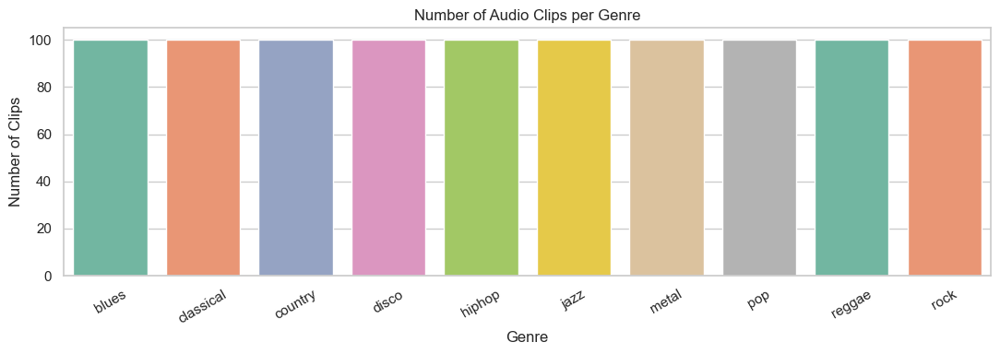

In [16]:
clip_count_df = (
    file_df.groupby("genre")
    .size()
    .reset_index(name="clip_count")
    .sort_values("genre")
)

display(clip_count_df)

plt.figure(figsize=(11, 4))
sns.barplot(data=clip_count_df, x="genre", y="clip_count", palette="Set2")
plt.title("Number of Audio Clips per Genre")
plt.xlabel("Genre")
plt.ylabel("Number of Clips")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()


In [17]:
sample_row = file_df.iloc[0]
sample_path = sample_row["path"]
sample_genre = sample_row["genre"]

sample_audio, sample_rate = librosa.load(sample_path, sr=None, mono=True)
sample_duration = len(sample_audio) / sample_rate

print(f"Sample file: {sample_path.name}")
print(f"Genre label: {sample_genre}")
print(f"Audio array shape: {sample_audio.shape}")
print(f"Sample rate: {sample_rate} Hz")
print(f"Duration: {sample_duration:.2f} seconds")

display(Audio(sample_audio, rate=sample_rate))


Sample file: blues.00000.wav
Genre label: blues
Audio array shape: (661794,)
Sample rate: 22050 Hz
Duration: 30.01 seconds


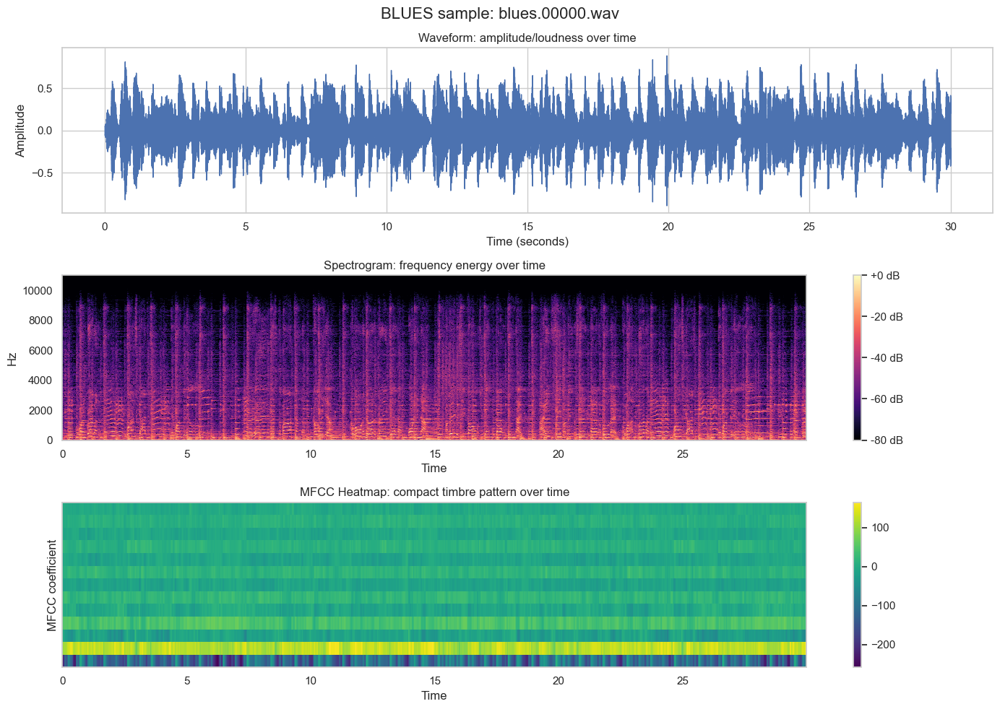

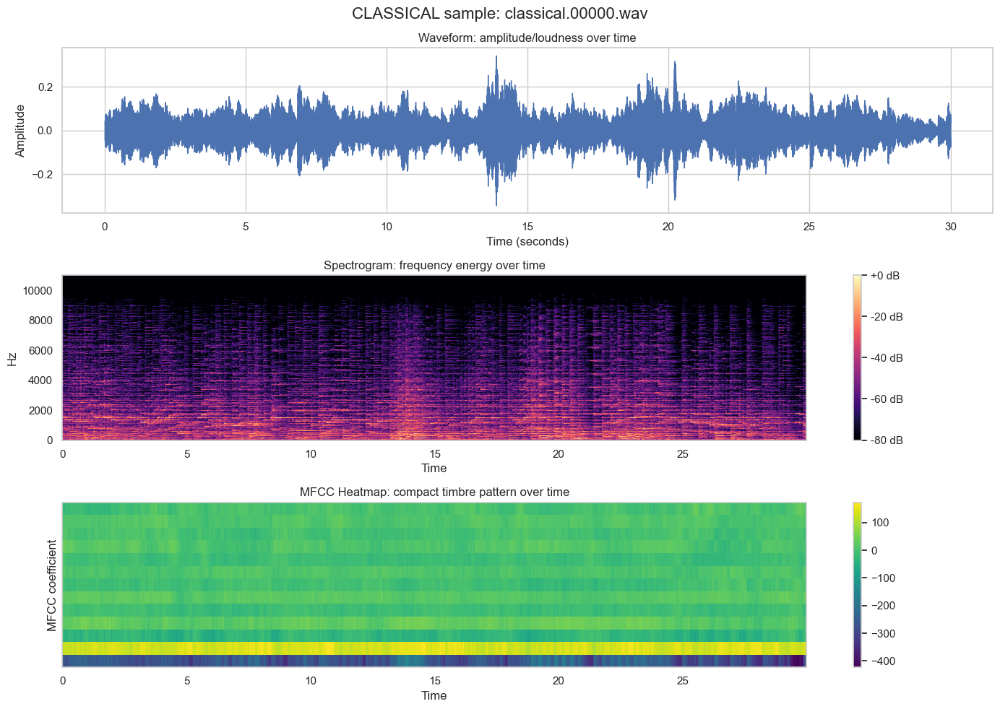

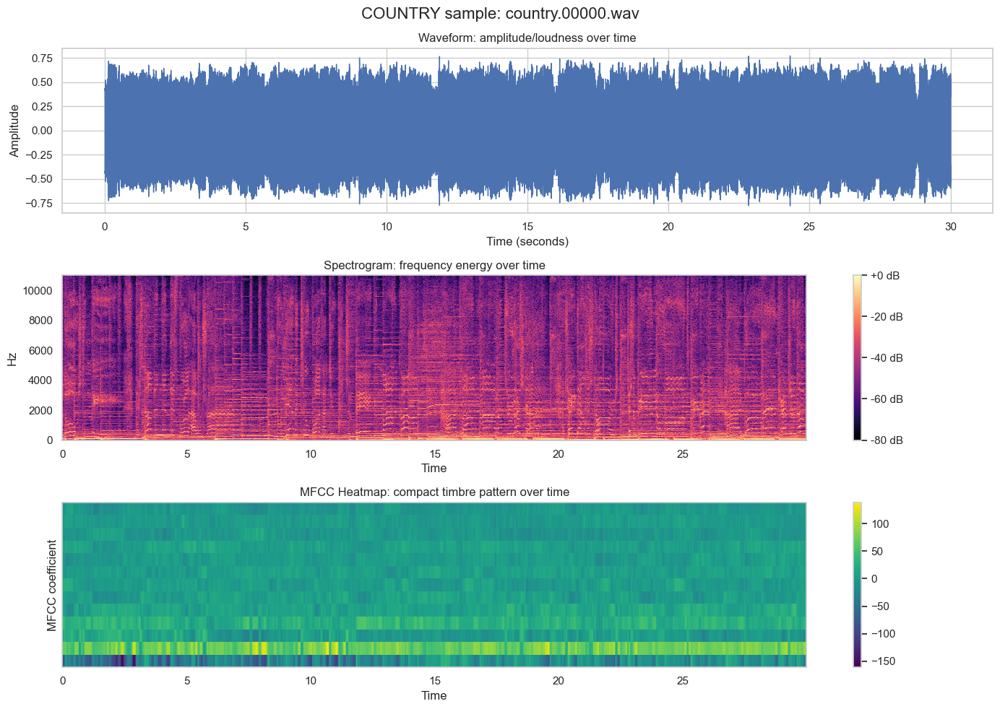

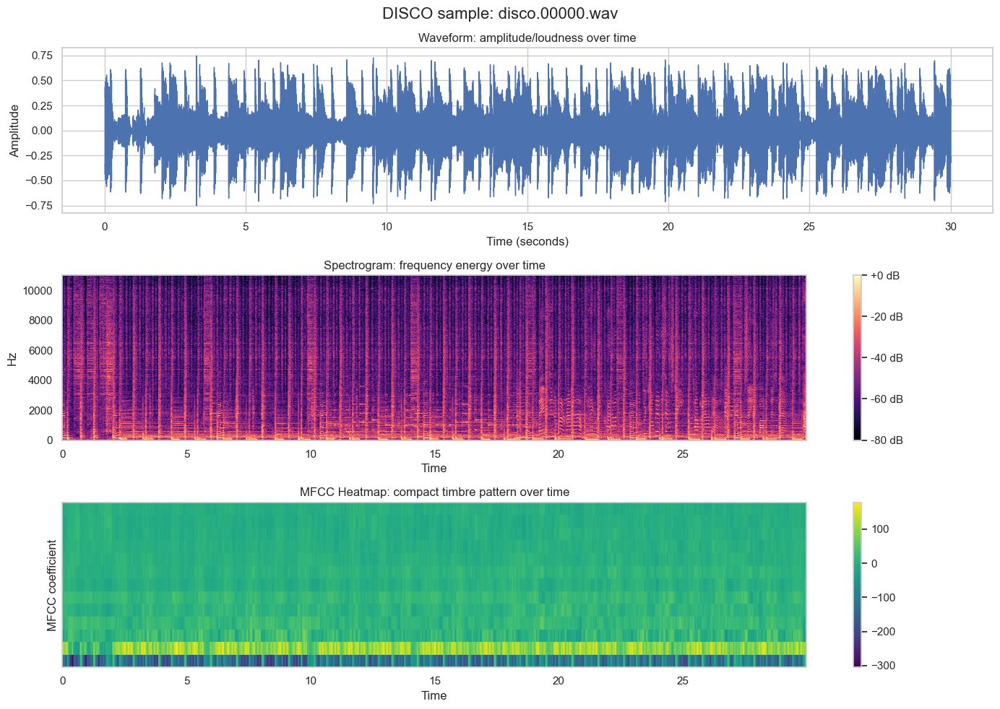

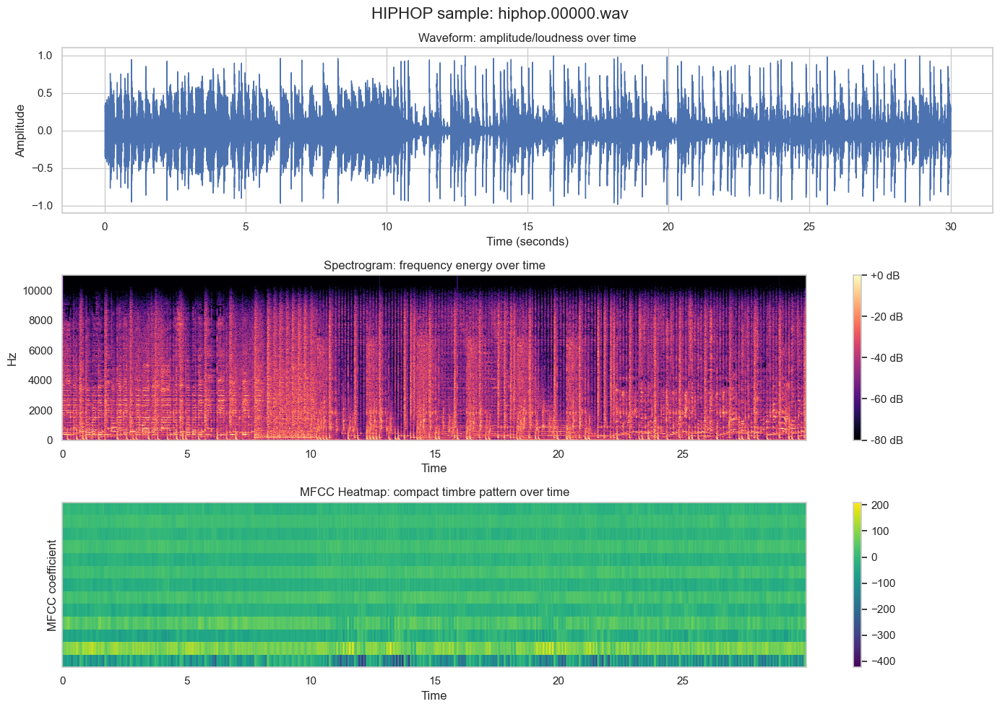

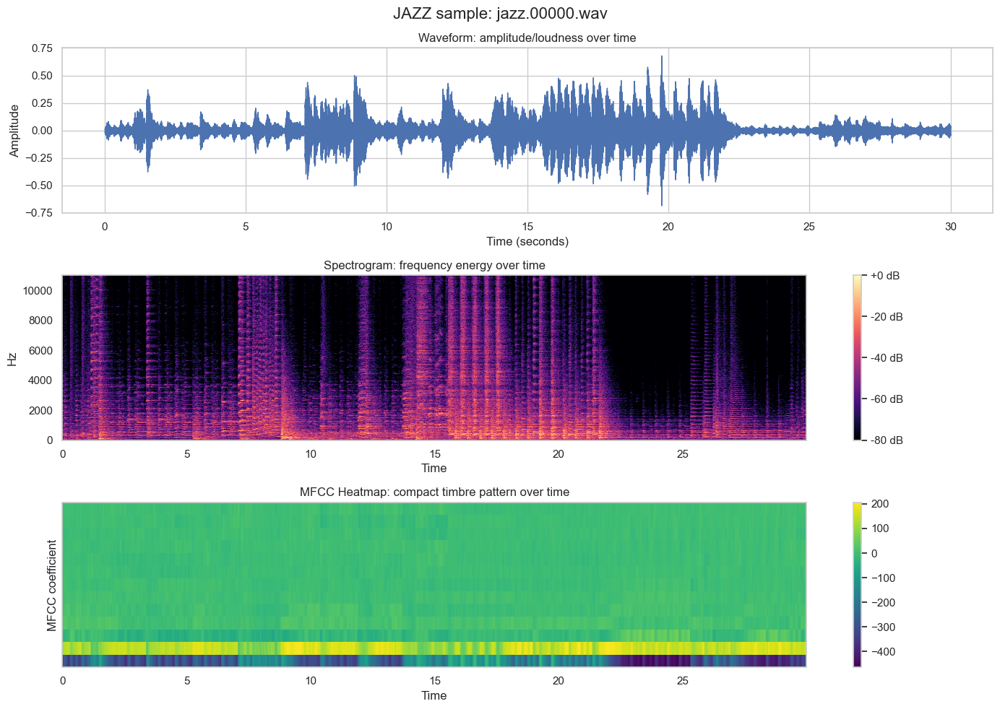

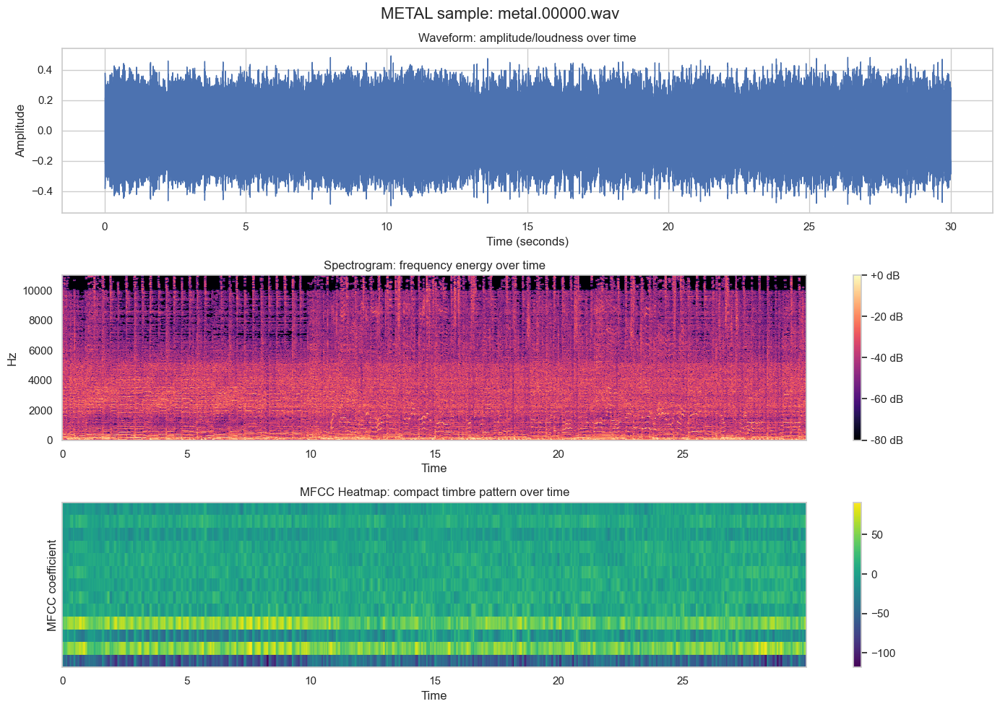

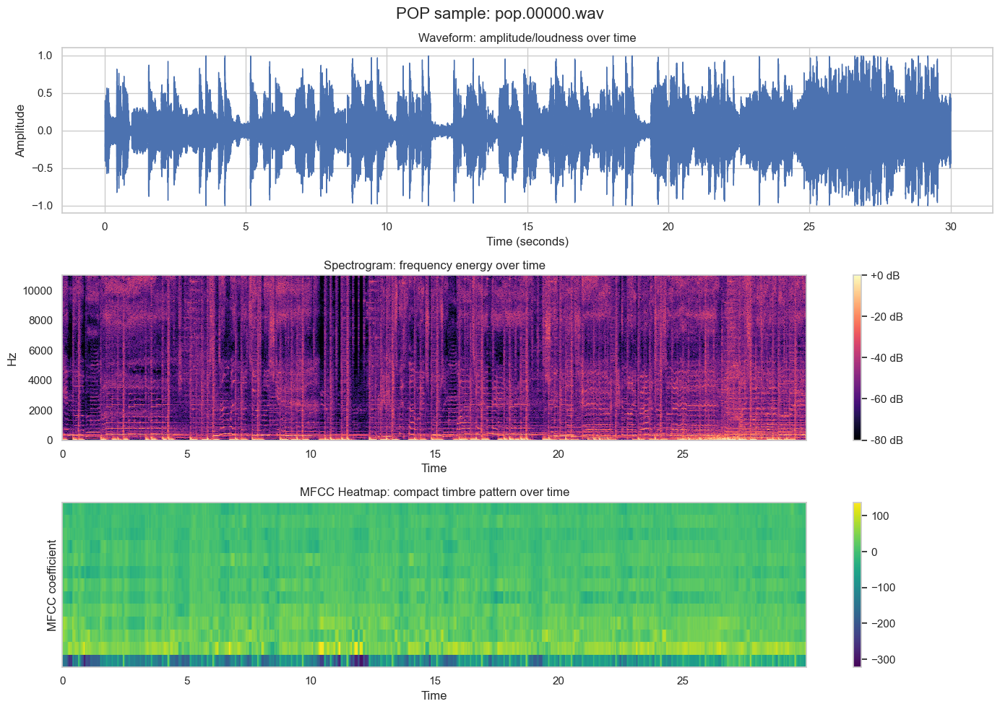

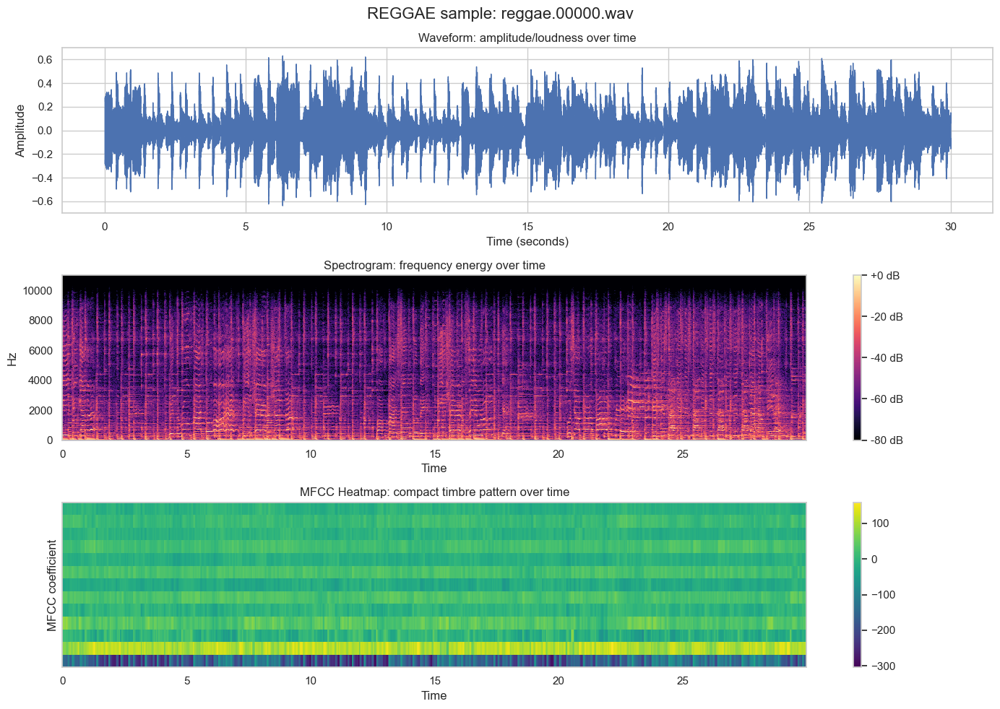

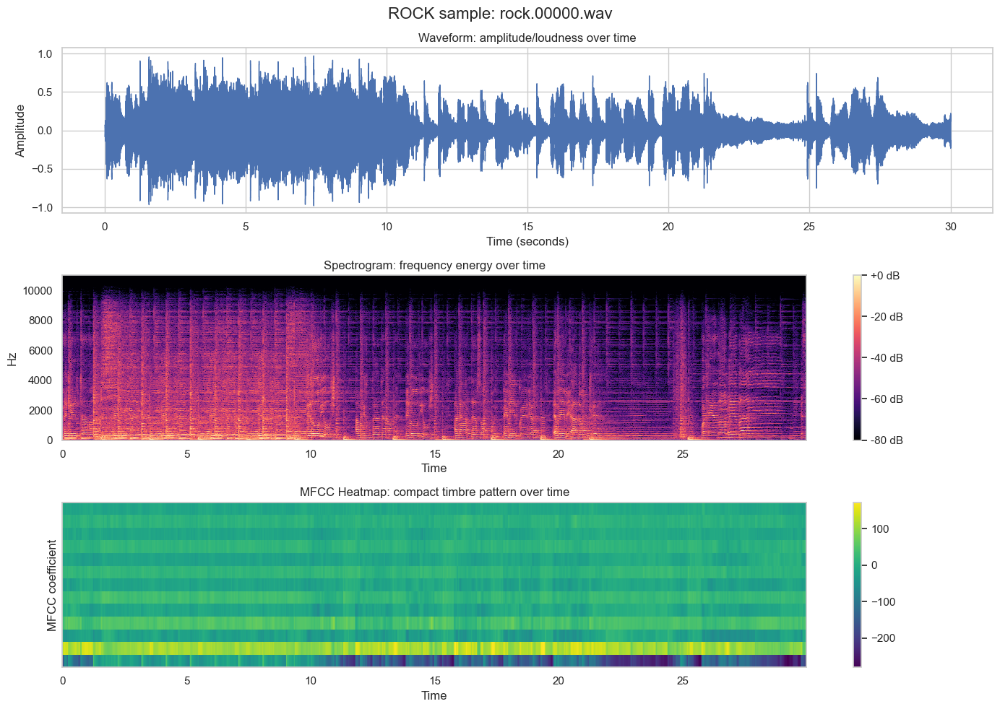

In [18]:
def load_audio_30_seconds(audio_path, target_sample_rate=22050):
    audio, sample_rate = librosa.load(
        audio_path,
        sr=target_sample_rate,
        mono=True,
        duration=30,
    )
    return audio, sample_rate

def plot_audio_views(audio_path, genre_name):
    audio, sample_rate = load_audio_30_seconds(audio_path)

    fig, axes = plt.subplots(3, 1, figsize=(14, 10))
    fig.suptitle(f"{genre_name.upper()} sample: {Path(audio_path).name}", fontsize=16)

    librosa.display.waveshow(audio, sr=sample_rate, ax=axes[0])
    axes[0].set_title("Waveform: amplitude/loudness over time")
    axes[0].set_xlabel("Time (seconds)")
    axes[0].set_ylabel("Amplitude")

    stft = librosa.stft(audio)
    stft_magnitude = np.abs(stft)
    spectrogram_db = librosa.amplitude_to_db(stft_magnitude, ref=np.max)
    spec_image = librosa.display.specshow(
        spectrogram_db,
        sr=sample_rate,
        x_axis="time",
        y_axis="hz",
        ax=axes[1],
        cmap="magma",
    )
    axes[1].set_title("Spectrogram: frequency energy over time")
    fig.colorbar(spec_image, ax=axes[1], format="%+2.0f dB")

    mfcc = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=13)
    mfcc_image = librosa.display.specshow(
        mfcc,
        sr=sample_rate,
        x_axis="time",
        ax=axes[2],
        cmap="viridis",
    )
    axes[2].set_title("MFCC Heatmap: compact timbre pattern over time")
    axes[2].set_ylabel("MFCC coefficient")
    fig.colorbar(mfcc_image, ax=axes[2])

    plt.tight_layout()
    plt.show()

for genre_name in EXPECTED_GENRES:
    genre_files = file_df[file_df["genre"] == genre_name]
    first_file_for_genre = genre_files.iloc[0]["path"]
    plot_audio_views(first_file_for_genre, genre_name)


In [19]:
def add_mean_and_std_features(feature_dict, feature_matrix, feature_prefix):
    feature_means = np.mean(feature_matrix, axis=1)
    feature_stds = np.std(feature_matrix, axis=1)

    for index, value in enumerate(feature_means):
        feature_dict[f"{feature_prefix}_{index + 1}_mean"] = value

    for index, value in enumerate(feature_stds):
        feature_dict[f"{feature_prefix}_{index + 1}_std"] = value

    return feature_dict

def extract_audio_features(audio_path, target_sample_rate=22050, duration=30):
    audio, sample_rate = librosa.load(
        audio_path,
        sr=target_sample_rate,
        mono=True,
        duration=duration,
    )

    if len(audio) == 0:
        raise ValueError("Audio file is empty or could not be decoded.")

    features = {}

    mfcc = librosa.feature.mfcc(
        y=audio,
        sr=sample_rate,
        n_mfcc=20,
    )
    features = add_mean_and_std_features(features, mfcc, "mfcc")

    chroma = librosa.feature.chroma_stft(
        y=audio,
        sr=sample_rate,
    )
    features = add_mean_and_std_features(features, chroma, "chroma")

    spectral_centroid = librosa.feature.spectral_centroid(
        y=audio,
        sr=sample_rate,
    )
    features["spectral_centroid_mean"] = np.mean(spectral_centroid)
    features["spectral_centroid_std"] = np.std(spectral_centroid)

    zero_crossing_rate = librosa.feature.zero_crossing_rate(
        y=audio
    )
    features["zero_crossing_rate_mean"] = np.mean(zero_crossing_rate)
    features["zero_crossing_rate_std"] = np.std(zero_crossing_rate)

    rms_energy = librosa.feature.rms(
        y=audio
    )
    features["rms_energy_mean"] = np.mean(rms_energy)
    features["rms_energy_std"] = np.std(rms_energy)

    return features


In [20]:
test_features = extract_audio_features(sample_path)
test_feature_df = pd.DataFrame([test_features])

print(f"Number of features extracted from one clip: {test_feature_df.shape[1]}")
display(test_feature_df.head())


Number of features extracted from one clip: 70


,mfcc_1_mean,mfcc_2_mean,mfcc_3_mean,mfcc_4_mean,mfcc_5_mean,mfcc_6_mean,mfcc_7_mean,mfcc_8_mean,mfcc_9_mean,mfcc_10_mean,mfcc_11_mean,mfcc_12_mean,mfcc_13_mean,mfcc_14_mean,mfcc_15_mean,mfcc_16_mean,mfcc_17_mean,mfcc_18_mean,mfcc_19_mean,mfcc_20_mean,mfcc_1_std,mfcc_2_std,mfcc_3_std,mfcc_4_std,mfcc_5_std,mfcc_6_std,mfcc_7_std,mfcc_8_std,mfcc_9_std,mfcc_10_std,mfcc_11_std,mfcc_12_std,mfcc_13_std,mfcc_14_std,mfcc_15_std,mfcc_16_std,mfcc_17_std,mfcc_18_std,mfcc_19_std,mfcc_20_std,chroma_1_mean,chroma_2_mean,chroma_3_mean,chroma_4_mean,chroma_5_mean,chroma_6_mean,chroma_7_mean,chroma_8_mean,chroma_9_mean,chroma_10_mean,chroma_11_mean,chroma_12_mean,chroma_1_std,chroma_2_std,chroma_3_std,chroma_4_std,chroma_5_std,chroma_6_std,chroma_7_std,chroma_8_std,chroma_9_std,chroma_10_std,chroma_11_std,chroma_12_std,spectral_centroid_mean,spectral_centroid_std,zero_crossing_rate_mean,zero_crossing_rate_std,rms_energy_mean,rms_energy_std
0,-113.619385,121.553032,-19.151056,42.345768,-6.371168,18.613033,-13.69206,15.339378,-12.283617,10.973776,-8.32241,8.806787,-3.665802,5.745939,-5.161711,0.750298,-1.688358,-0.409328,-2.298869,1.219947,50.703182,17.19664,15.34861,12.281505,12.962432,9.442965,8.222213,8.310419,9.063802,7.962441,7.861968,7.161843,6.422743,6.368751,7.058576,7.243213,6.046867,6.453187,7.421367,6.853878,0.361727,0.367619,0.43998,0.244634,0.247802,0.335615,0.364576,0.435647,0.295841,0.314634,0.40656,0.38477,0.326643,0.285993,0.31635,0.211377,0.256345,0.289118,0.277317,0.346258,0.253804,0.280253,0.332703,0.292561,1784.416546,360.194166,0.083066,0.02769,0.130192,0.053201


In [21]:
feature_rows = []
failed_files = []
total_files = len(file_df)

for index, row in file_df.reset_index(drop=True).iterrows():
    audio_path = row["path"]
    genre_name = row["genre"]

    try:
        extracted_features = extract_audio_features(audio_path)
        extracted_features["genre"] = genre_name
        extracted_features["filename"] = audio_path.name
        extracted_features["file_path"] = str(audio_path)
        feature_rows.append(extracted_features)
    except Exception as error:
        failed_files.append({"path": str(audio_path), "error": str(error)})

    if (index + 1) % 50 == 0 or (index + 1) == total_files:
        print(f"Processed {index + 1}/{total_files} files")

features_df = pd.DataFrame(feature_rows)
failed_df = pd.DataFrame(failed_files)

print(f"Feature rows created: {len(features_df)}")
print(f"Files failed: {len(failed_df)}")

if not failed_df.empty:
    display(failed_df)

display(features_df.head())


Processed 50/1000 files
Processed 100/1000 files
Processed 150/1000 files
Processed 200/1000 files
Processed 250/1000 files
Processed 300/1000 files
Processed 350/1000 files
Processed 400/1000 files
Processed 450/1000 files
Processed 500/1000 files
Processed 550/1000 files


c:\Users\darsh\AppData\Local\Programs\Python\Python313\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Processed 600/1000 files
Processed 650/1000 files
Processed 700/1000 files
Processed 750/1000 files
Processed 800/1000 files
Processed 850/1000 files
Processed 900/1000 files
Processed 950/1000 files
Processed 1000/1000 files
Feature rows created: 999
Files failed: 1


,path,error
0,c:\Users\darsh\Documents\Codex\2026-04-27\i-am...,


,mfcc_1_mean,mfcc_2_mean,mfcc_3_mean,mfcc_4_mean,mfcc_5_mean,mfcc_6_mean,mfcc_7_mean,mfcc_8_mean,mfcc_9_mean,mfcc_10_mean,mfcc_11_mean,mfcc_12_mean,mfcc_13_mean,mfcc_14_mean,mfcc_15_mean,mfcc_16_mean,mfcc_17_mean,mfcc_18_mean,mfcc_19_mean,mfcc_20_mean,mfcc_1_std,mfcc_2_std,mfcc_3_std,mfcc_4_std,mfcc_5_std,mfcc_6_std,mfcc_7_std,mfcc_8_std,mfcc_9_std,mfcc_10_std,mfcc_11_std,mfcc_12_std,mfcc_13_std,mfcc_14_std,mfcc_15_std,mfcc_16_std,mfcc_17_std,mfcc_18_std,mfcc_19_std,mfcc_20_std,chroma_1_mean,chroma_2_mean,chroma_3_mean,chroma_4_mean,chroma_5_mean,chroma_6_mean,chroma_7_mean,chroma_8_mean,chroma_9_mean,chroma_10_mean,chroma_11_mean,chroma_12_mean,chroma_1_std,chroma_2_std,chroma_3_std,chroma_4_std,chroma_5_std,chroma_6_std,chroma_7_std,chroma_8_std,chroma_9_std,chroma_10_std,chroma_11_std,chroma_12_std,spectral_centroid_mean,spectral_centroid_std,zero_crossing_rate_mean,zero_crossing_rate_std,rms_energy_mean,rms_energy_std,genre,filename,file_path
0,-113.619385,121.553032,-19.151056,42.345768,-6.371168,18.613033,-13.692060,15.339378,-12.283617,10.973776,-8.322410,8.806787,-3.665802,5.745939,-5.161711,0.750298,-1.688358,-0.409328,-2.298869,1.219947,50.703182,17.196640,15.348610,12.281505,12.962432,9.442965,8.222213,8.310419,9.063802,7.962441,7.861968,7.161843,6.422743,6.368751,7.058576,7.243213,6.046867,6.453187,7.421367,6.853878,0.361727,0.367619,0.439980,0.244634,0.247802,0.335615,0.364576,0.435647,0.295841,0.314634,0.406560,0.384770,0.326643,0.285993,0.316350,0.211377,0.256345,0.289118,0.277317,0.346258,0.253804,0.280253,0.332703,0.292561,1784.416546,360.194166,0.083066,0.027690,0.130192,0.053201,blues,blues.00000.wav,c:\Users\darsh\Documents\Codex\2026-04-27\i-am...
1,-207.581512,123.997147,8.939115,35.870758,2.919970,21.518787,-8.555368,23.355938,-10.101037,11.906445,-5.558123,5.375942,-2.237833,4.217125,-6.011047,0.932668,-0.717028,0.292333,-0.285717,0.532144,88.151985,23.667763,23.931154,16.274376,16.734621,12.508815,14.176376,11.931994,12.893105,10.215605,10.257861,9.813216,8.056108,8.554412,7.244653,7.440719,7.753276,6.938137,7.150609,6.769286,0.459622,0.349877,0.320969,0.211586,0.200908,0.331005,0.397647,0.560676,0.384379,0.255474,0.284959,0.334238,0.377441,0.296917,0.308389,0.228813,0.209032,0.310960,0.282470,0.366773,0.295321,0.233215,0.279057,0.269227,1529.871314,613.197888,0.056044,0.038059,0.095892,0.048724,blues,blues.00001.wav,c:\Users\darsh\Documents\Codex\2026-04-27\i-am...
2,-90.776344,140.448608,-29.100559,31.687340,-13.975971,25.741686,-13.644712,11.623112,-11.775920,9.700466,-13.115349,5.785763,-8.899733,-1.087024,-9.216774,2.453648,-7.721793,-1.816497,-3.434354,-2.231391,57.617649,22.563511,20.297462,12.006150,12.490621,8.629561,10.328758,10.326070,8.104654,8.236836,7.592525,8.037509,7.776660,7.598978,6.038823,6.373398,6.906538,7.240040,6.828621,5.534097,0.272671,0.195869,0.315254,0.408135,0.547083,0.321775,0.304787,0.288517,0.334242,0.401911,0.384308,0.588190,0.211366,0.180956,0.271610,0.271332,0.350195,0.235831,0.241880,0.251462,0.247350,0.333228,0.251577,0.352950,1552.637786,395.649207,0.076301,0.031738,0.175494,0.052465,blues,blues.00002.wav,c:\Users\darsh\Documents\Codex\2026-04-27\i-am...
3,-199.462006,150.094727,5.649167,26.870144,1.755441,14.236881,-4.828873,9.297849,-0.753142,8.147393,-3.195236,6.085354,-2.476188,-1.076225,-2.876056,0.776909,-3.320055,0.637263,-0.617507,-3.406940,74.134827,21.367420,16.032692,12.577670,16.367716,11.264206,12.492485,9.009487,9.610511,8.439375,10.503592,6.941436,7.537466,7.890133,7.186542,6.667608,7.087804,6.111621,6.106649,5.655832,0.340862,0.408577,0.524569,0.547074,0.657113,0.511671,0.355630,0.251690,0.246386,0.315209,0.316543,0.382855,0.249694,0.237259,0.326188,0.303579,0.345129,0.303468,0.231731,0.199450,0.215124,0.293838,0.281090,0.337159,1070.110059,429.542379,0.033309,0.020569,0.141139,0.079623,blues,blues.00003.wav,c:\Users\darsh\Documents\Codex\2026-04-27\i-am...
4,-160.291855,126.195770,-35.602501,22.151169,-32.487640,10.862022,-23.357162,0.500523,-11.80

In [22]:
output_csv_path = PROJECT_ROOT / "gtzan_extracted_audio_features.csv"
features_df.to_csv(output_csv_path, index=False)

print(f"Saved extracted features to: {output_csv_path}")
print(f"Feature matrix shape: {features_df.shape}")


Saved extracted features to: c:\Users\darsh\Documents\Codex\2026-04-27\i-am-a-first-year-computer\gtzan_extracted_audio_features.csv
Feature matrix shape: (999, 73)


In [23]:
metadata_columns = ["genre", "filename", "file_path"]
feature_columns = [column for column in features_df.columns if column not in metadata_columns]

X = features_df[feature_columns]
y = features_df["genre"]

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.20,
    random_state=RANDOM_STATE,
    stratify=y,
)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(f"Training rows: {X_train.shape[0]}")
print(f"Testing rows: {X_test.shape[0]}")
print(f"Number of input features: {X_train.shape[1]}")


Training rows: 799
Testing rows: 200
Number of input features: 70


In [24]:
svm_model = SVC(
    kernel="rbf",
    C=10,
    gamma="scale",
    probability=True,
    random_state=RANDOM_STATE,
)

svm_model.fit(X_train_scaled, y_train)

print("SVM training complete.")


SVM training complete.


In [25]:
rf_model = RandomForestClassifier(
    n_estimators=500,
    max_depth=None,
    class_weight="balanced",
    random_state=RANDOM_STATE,
    n_jobs=-1,
)

rf_model.fit(X_train_scaled, y_train)

print("Random Forest training complete.")


Random Forest training complete.


In [26]:
def evaluate_classifier(model_name, model, X_eval, y_eval):
    predictions = model.predict(X_eval)
    accuracy = accuracy_score(y_eval, predictions)
    report = classification_report(
        y_eval,
        predictions,
        labels=EXPECTED_GENRES,
        zero_division=0,
    )

    return {
        "model_name": model_name,
        "predictions": predictions,
        "accuracy": accuracy,
        "report": report,
    }

svm_results = evaluate_classifier("SVM", svm_model, X_test_scaled, y_test)
rf_results = evaluate_classifier("Random Forest", rf_model, X_test_scaled, y_test)

comparison_df = pd.DataFrame(
    [
        {"Model": svm_results["model_name"], "Accuracy": svm_results["accuracy"]},
        {"Model": rf_results["model_name"], "Accuracy": rf_results["accuracy"]},
    ]
)

display(comparison_df)

print("SVM Classification Report")
print(svm_results["report"])

print("Random Forest Classification Report")
print(rf_results["report"])


,Model,Accuracy
0,SVM,0.735
1,Random Forest,0.715


SVM Classification Report
              precision    recall  f1-score   support

       blues       0.71      0.85      0.77        20
   classical       0.86      0.95      0.90        20
     country       0.65      0.75      0.70        20
       disco       0.62      0.40      0.48        20
      hiphop       0.70      0.80      0.74        20
        jazz       0.82      0.90      0.86        20
       metal       0.89      0.85      0.87        20
         pop       0.68      0.75      0.71        20
      reggae       0.65      0.55      0.59        20
        rock       0.73      0.55      0.63        20

    accuracy                           0.73       200
   macro avg       0.73      0.73      0.73       200
weighted avg       0.73      0.73      0.73       200

Random Forest Classification Report
              precision    recall  f1-score   support

       blues       0.73      0.40      0.52        20
   classical       0.86      0.95      0.90        20
     country    

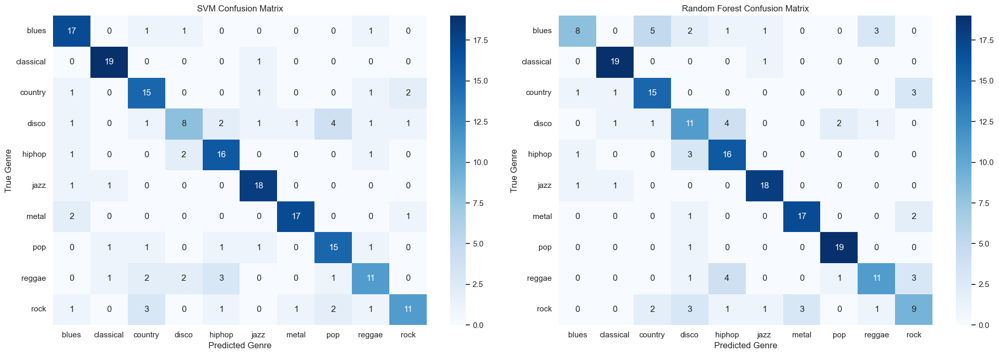

In [27]:
def plot_confusion_matrix_on_axis(axis, y_true, y_pred, title):
    matrix = confusion_matrix(
        y_true,
        y_pred,
        labels=EXPECTED_GENRES,
    )

    sns.heatmap(
        matrix,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=EXPECTED_GENRES,
        yticklabels=EXPECTED_GENRES,
        ax=axis,
    )

    axis.set_title(title)
    axis.set_xlabel("Predicted Genre")
    axis.set_ylabel("True Genre")

fig, axes = plt.subplots(1, 2, figsize=(20, 7))
plot_confusion_matrix_on_axis(axes[0], y_test, svm_results["predictions"], "SVM Confusion Matrix")
plot_confusion_matrix_on_axis(axes[1], y_test, rf_results["predictions"], "Random Forest Confusion Matrix")
plt.tight_layout()
plt.show()


In [28]:
def predict_custom_audio(audio_path, model, scaler_object, feature_column_names):
    audio_path = Path(audio_path)

    if not audio_path.exists():
        raise FileNotFoundError(f"Custom audio file not found: {audio_path}")

    custom_features = extract_audio_features(audio_path)
    custom_features_df = pd.DataFrame([custom_features])
    custom_features_df = custom_features_df.reindex(columns=feature_column_names)
    custom_features_scaled = scaler_object.transform(custom_features_df)

    probabilities = model.predict_proba(custom_features_scaled)[0]
    class_names = model.classes_
    best_index = int(np.argmax(probabilities))
    predicted_genre = class_names[best_index]
    confidence = float(probabilities[best_index])

    ranking_df = pd.DataFrame(
        {
            "genre": class_names,
            "confidence": probabilities,
        }
    ).sort_values("confidence", ascending=False)

    return predicted_genre, confidence, ranking_df

CUSTOM_AUDIO_PATH = None

if CUSTOM_AUDIO_PATH is not None:
    predicted_genre, confidence, ranking_df = predict_custom_audio(
        CUSTOM_AUDIO_PATH,
        svm_model,
        scaler,
        feature_columns,
    )

    print(f"Predicted genre: {predicted_genre}")
    print(f"Confidence: {confidence:.2%}")
    display(ranking_df)
else:
    print("Set CUSTOM_AUDIO_PATH to a .wav or .mp3 file path, then run this cell again.")


Set CUSTOM_AUDIO_PATH to a .wav or .mp3 file path, then run this cell again.
